# Load the LGMR data (mean of the ensemble)

In [1]:
import xarray as xr
# open the 'LGMR_GMST_ens.nc' file
ds_sat = xr.open_dataset('data/LGMR_SAT_climo.nc')
ds_sat.info


# load the ds_GMM_climo_relabeled
import xarray as xr
ds_GMM_climo_relabeled = xr.open_dataset('climo_ana_data/ds_GMM_climo_relabeled.nc')
# ds_GMM_climo_relabeled
ref_labels = ds_GMM_climo_relabeled['class_relabeled'].values.reshape(96*144,)

c:\Users\zps19\.conda\envs\pz-env\lib\site-packages\xarray\coding\variables.py:148: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  condition |= data == fv


# Center and weight the data

shape of the weight: (96,)
shape of the reshaped sat_centered_weighted: (50, 13824)


c:\Users\zps19\.conda\envs\pz-env\lib\site-packages\xarray\coding\variables.py:148: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  condition |= data == fv


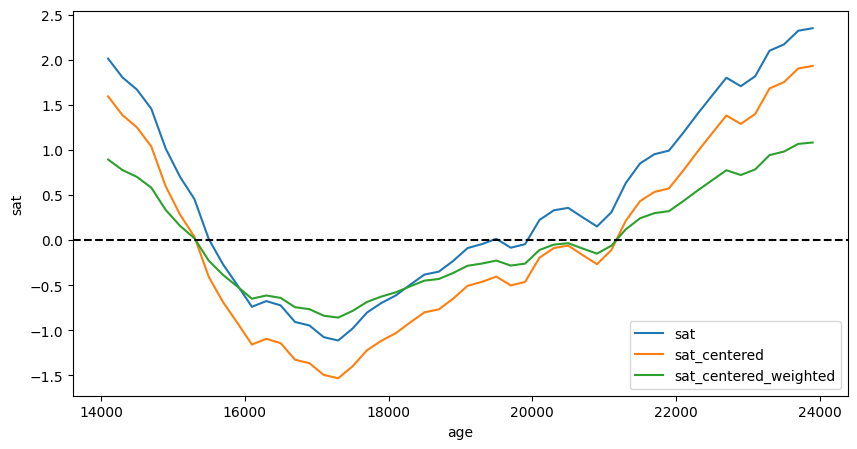

shape of the reshaped sat_centered_weighted: (13824, 50)
shape of u, s, vh: (13824, 13824) (50,) (50, 50)
shape of EOFs: (13824, 2)
shape of PCs: (50, 2)
Explained variance: [6.9087273e-01 2.7686661e-01 1.4081990e-02 7.9770917e-03 3.7492465e-03
 2.0848040e-03 1.2548419e-03 7.8027707e-04 6.3050387e-04 3.6273419e-04
 3.2023349e-04 2.5993100e-04 2.0234540e-04 1.2076710e-04 8.4889398e-05
 7.0630638e-05 5.5111501e-05 4.4573597e-05 3.6388890e-05 3.0430276e-05
 2.5678864e-05 1.8224862e-05 1.3789796e-05 1.0624692e-05 9.5944742e-06
 7.7527002e-06 5.0980052e-06 3.8973726e-06 2.7266960e-06 2.5073728e-06
 2.1428336e-06 1.8861168e-06 1.7020600e-06 1.3982584e-06 1.1953463e-06
 1.0817608e-06 8.9914471e-07 6.6980419e-07 6.2356241e-07 4.9549550e-07
 4.2556047e-07 3.4099696e-07 3.0148908e-07 2.5093971e-07 1.8639047e-07
 1.3638802e-07 1.1958207e-07 8.1747586e-08 6.7086553e-08 2.9113140e-12]


In [2]:
from toolbox import PCA_functions as pf

# ds_sat = ds_sat.where(ds_sat.age>=11000, drop=True)

ds_sat = ds_sat.where(ds_sat.age>=14000, drop=True)


# 1. Center the Data
ds_sat = pf.center_data(ds_sat)

# 2. Weight the Data
ds_sat = pf.apply_weighting(ds_sat)

# 3. Plot the Centered and Weighted Data
lat_index = 77
lon_index = 90
pf.plot_sat_variables(ds_sat, lat_index, lon_index)

from toolbox import PCA_functions as pf
import importlib
importlib.reload(pf)
# 4. Perform PCA
exp_v_climo, eofs_climo, pcs_climo = pf.sat_PCA(ds_sat)
print('Explained variance:', exp_v_climo)




In [12]:
ds_sat

<xarray.Dataset>
Dimensions:                (age: 50, lat: 96, lon: 144)
Coordinates:
  * lat                    (lat) float32 -90.0 -88.11 -86.21 ... 88.11 90.0
  * lon                    (lon) float32 0.0 2.5 5.0 7.5 ... 352.5 355.0 357.5
  * age                    (age) float32 1.41e+04 1.43e+04 ... 2.37e+04 2.39e+04
Data variables:
    sat                    (age, lat, lon) float32 -52.92 -52.9 ... -41.98
    sat_std                (age, lat, lon) float32 0.9079 0.9112 ... 3.533 3.536
    sat_centered           (age, lat, lon) float32 2.388 2.39 ... 2.679 2.678
    weight                 (lat) float32 0.0 0.03306 0.06609 ... 0.03306 0.0
    sat_centered_weighted  (age, lat, lon) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0

In [3]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.stats import zscore
import numpy as np
from sklearn.mixture import GaussianMixture
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

def GMM4EOFS4gif(data, ds_sat,n_components=4,init_params='random',max_iter=100):
    # colors = ['blue', 'pink', 'green', 'orange', 'purple', 'brown', 'red', 'gray', 'olive', 'cyan']
    # colors=[(127, 201, 127),(190, 174, 212),(253, 192, 134),(255, 255, 153),(56, 108, 176),(240, 2, 127),(191, 91, 23),(102, 102, 102)]
    # n_components=5
    sat_shape=ds_sat['sat'].shape

    # create a 2D GMM model
    gmm_model = GaussianMixture(n_components=n_components, covariance_type='full',init_params=init_params,max_iter=max_iter)

    # fit the model to the two columns of PCA scores
    gmm_model.fit(data)

    # get the predicted class labels for each data point
    class_labels = gmm_model.predict(data)
    probabilities = gmm_model.predict_proba(data)
    max_prob = np.amax(probabilities, axis=1)


    # new_ds=ds_sat.copy()
    # add the class labels to the xarray dataset
    ds=ds_sat.copy()
    ds['class_label'] = (('lat', 'lon'), class_labels.reshape(sat_shape[1], sat_shape[2]))
    reshaped_probs = max_prob.reshape(sat_shape[1], sat_shape[2])


    unique_labels = np.unique(class_labels)
    # cmap = plt.get_cmap('Accent', len(unique_labels))
    custom_colors = [
    (0.4980392156862745, 0.788235294117647, 0.4980392156862745),
    (0.9921568627450981, 0.7529411764705882, 0.5254901960784314),
    (0.9411764705882353, 0.00784313725490196, 0.4980392156862745),
    (0.27450980392156865, 0.5098039215686274, 0.7058823529411765),
    (0.4, 0.4, 0.4)]

    # Create a ListedColormap object with your custom colors
    cmap = ListedColormap(custom_colors)


    # plot the results
    fig, ax = plt.subplots(1, 2, figsize=(8, 4), dpi=300)

    # plot the scatter plot of the two columns
    for i in range(n_components):
        mask = class_labels == i
        # ax[0].scatter(sat_scores[:, 0][mask], sat_scores[:, 1][mask], s=10, alpha=0.5, color=colors[i % len(colors)])
        ax[0].scatter(data[:, 0][mask], data[:, 1][mask], s=10, alpha=0.5, color=cmap(i))

    # plot the contour plot of the fitted GMM
    x, y = np.meshgrid(np.linspace(np.min(data[:, 0]), np.max(data[:, 0]), 100),
                        np.linspace(np.min(data[:, 1]), np.max(data[:, 1]), 100))
    XX = np.array([x.ravel(), y.ravel()]).T
    Z = -gmm_model.score_samples(XX)
    Z = Z.reshape(x.shape)
    ax[1].contour(x, y, Z, cmap='coolwarm_r')

    # Add labels and title
    ax[0].set_xlabel('EOF 1')
    ax[0].set_ylabel('EOF 2')
    ax[1].set_xlabel('EOF 1')
    ax[1].set_ylabel('EOF 2')
    ax[0].set_title('Scatter plot of loadings')
    ax[1].set_title('Contour plot of fitted GMM')

    plt.tight_layout()
    plt.show()

    return ds,reshaped_probs


###############################################################################################
# function to plot the class labels on a map

import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np

def plot_labels(ds,label_var_name='class_label'):
    sat_label = ds[label_var_name]

    # colors = ['blue', 'pink', 'green', 'orange', 'purple', 'brown', 'red', 'gray', 'olive', 'cyan']
    
    # create a figure and axis with Robinson projection
    fig, ax = plt.subplots(figsize=(10, 5), subplot_kw=dict(projection=ccrs.Robinson()), dpi=300)

    # add coastline and gridlines
    ax.add_feature(cfeature.COASTLINE)
    ax.gridlines()

    # create colormap with unique colors for each class label
    # cmap = mcolors.ListedColormap(colors[0:len(np.unique(sat_label))])
    unique_labels = np.unique(sat_label)
    # cmap = plt.get_cmap('Accent', len(unique_labels))

    if len(unique_labels) <= 4:
        custom_colors = [
        (0.4980392156862745, 0.788235294117647, 0.4980392156862745),
        (0.9921568627450981, 0.7529411764705882, 0.5254901960784314),
        (0.9411764705882353, 0.00784313725490196, 0.4980392156862745),
        (0.27450980392156865, 0.5098039215686274, 0.7058823529411765),]

        # Create a ListedColormap object with your custom colors
        cmap = ListedColormap(custom_colors)   
    else:
        cmap = plt.get_cmap('Accent', len(unique_labels))
    # plot heatmap with Robinson projection
    im = sat_label.plot(ax=ax, transform=ccrs.PlateCarree(), cmap=cmap, shading='auto', add_colorbar=False)

    # set global extent for Robinson projection
    ax.set_global()
    
    # set title
    ax.set_title('Spatial distribution of class labels')

    # add colorbar
    bounds = np.arange(len(np.unique(sat_label))+1) - 0.5
    ticks = np.arange(len(np.unique(sat_label)))
    cbar = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.05, boundaries=bounds, ticks=ticks)
    cbar.ax.set_yticklabels(np.unique(sat_label))
    cbar.ax.set_ylabel('Class Label')

    # show plot
    plt.show()

max_iter: 1


c:\Users\zps19\.conda\envs\pz-env\lib\site-packages\sklearn\mixture\_base.py:274: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


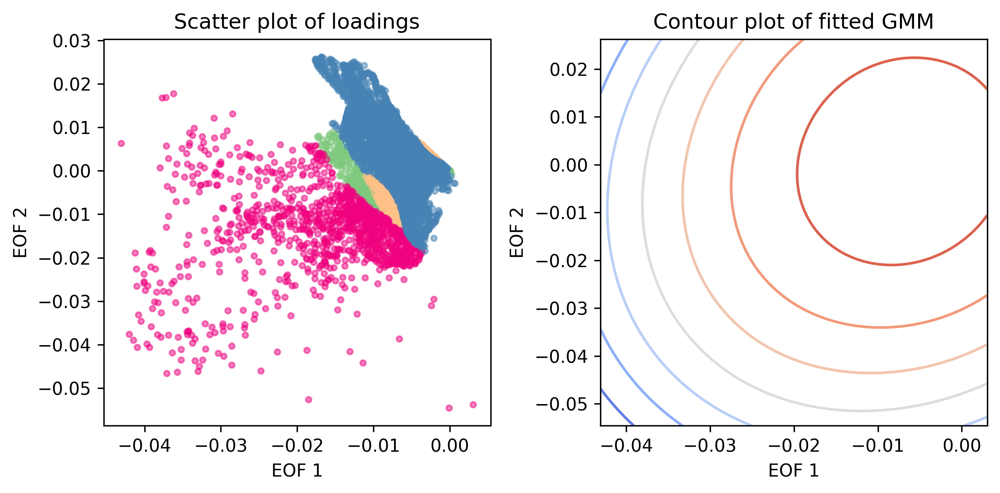

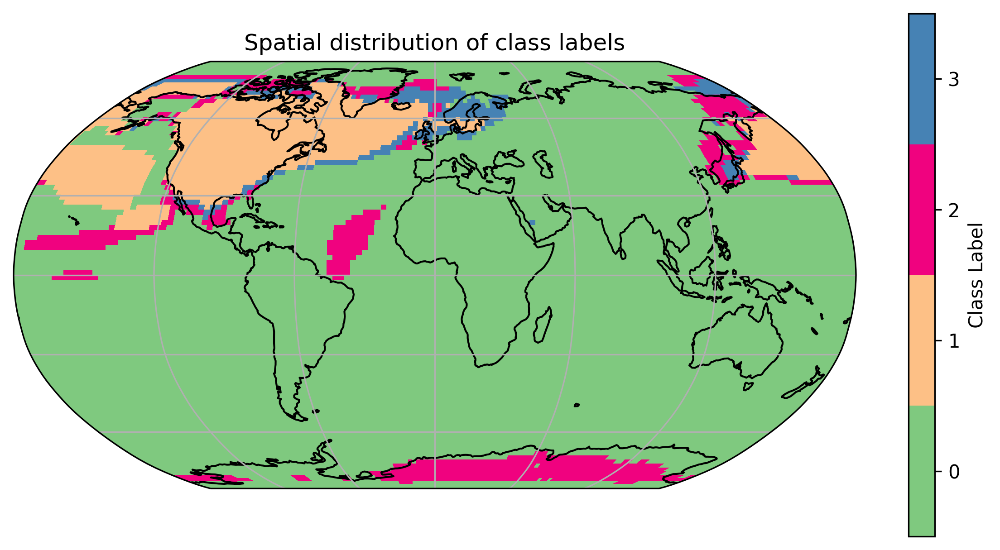

max_iter: 2


c:\Users\zps19\.conda\envs\pz-env\lib\site-packages\sklearn\mixture\_base.py:274: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


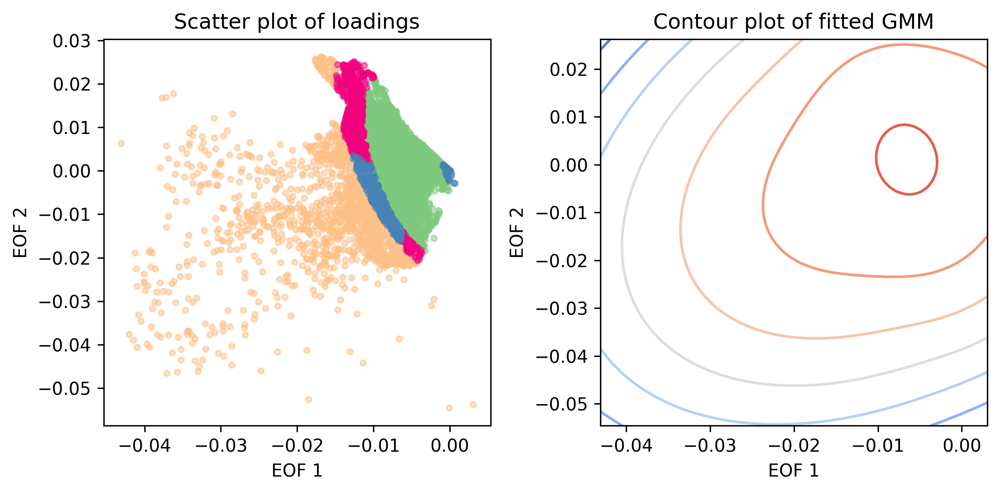

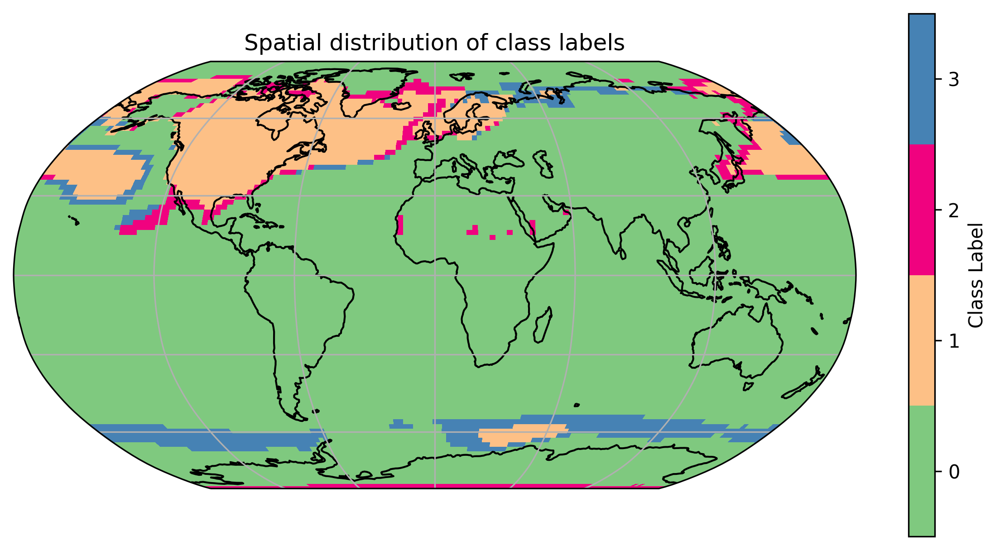

max_iter: 3


c:\Users\zps19\.conda\envs\pz-env\lib\site-packages\sklearn\mixture\_base.py:274: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


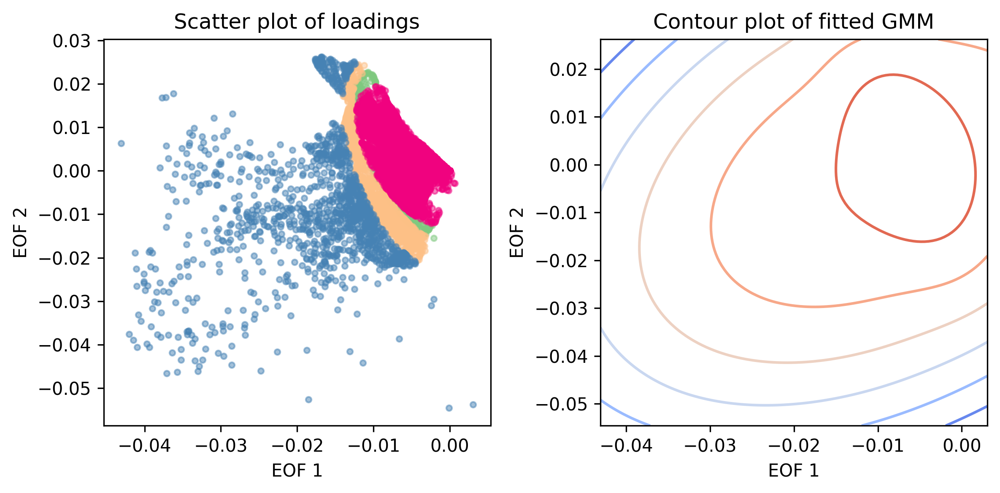

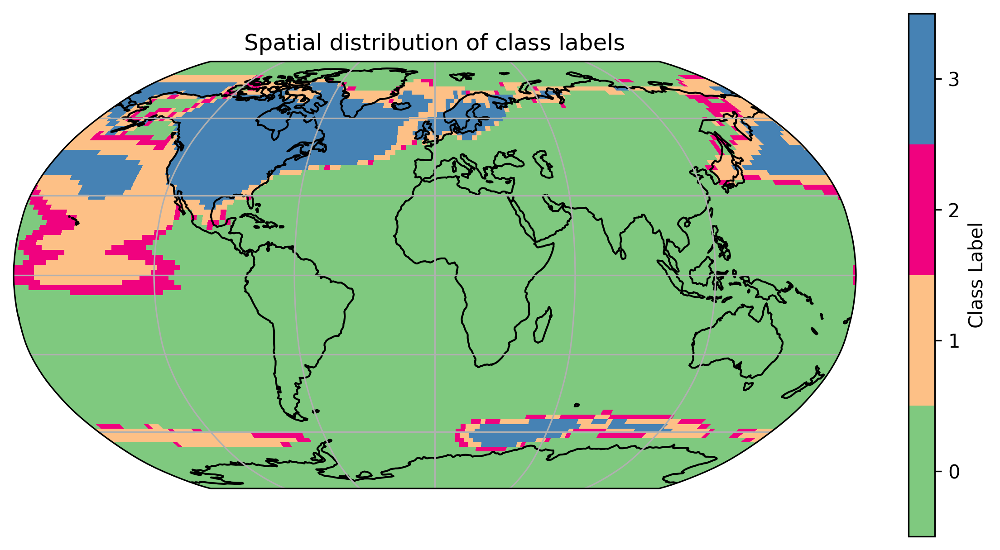

max_iter: 4


c:\Users\zps19\.conda\envs\pz-env\lib\site-packages\sklearn\mixture\_base.py:274: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


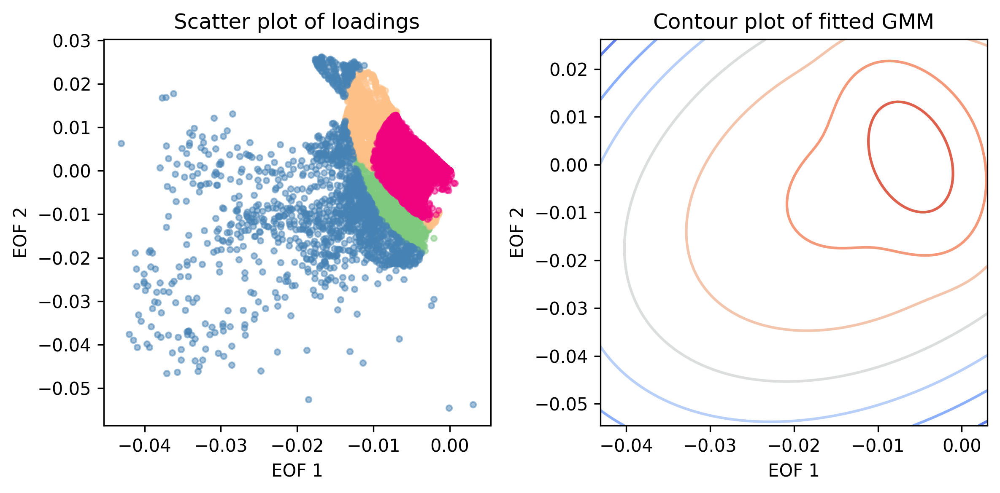

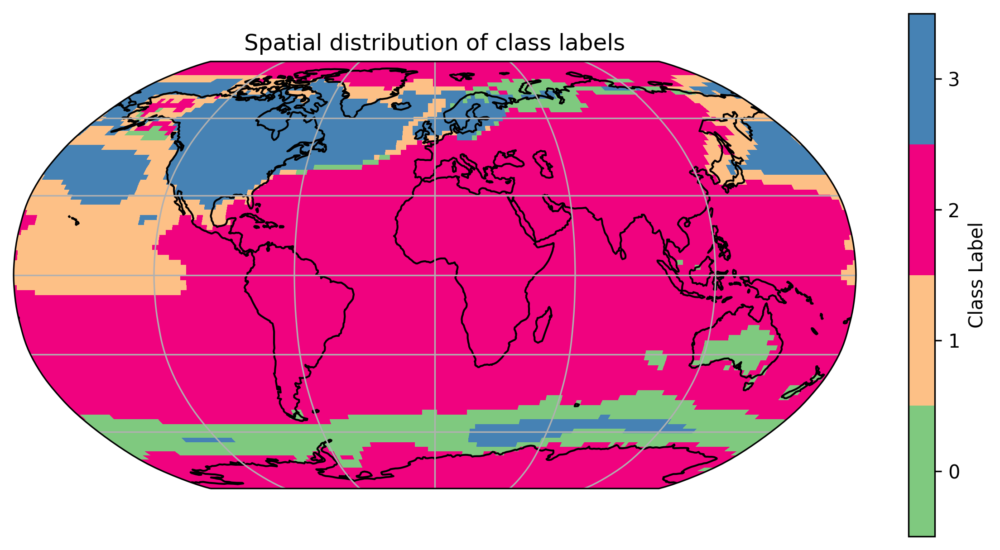

max_iter: 5


c:\Users\zps19\.conda\envs\pz-env\lib\site-packages\sklearn\mixture\_base.py:274: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


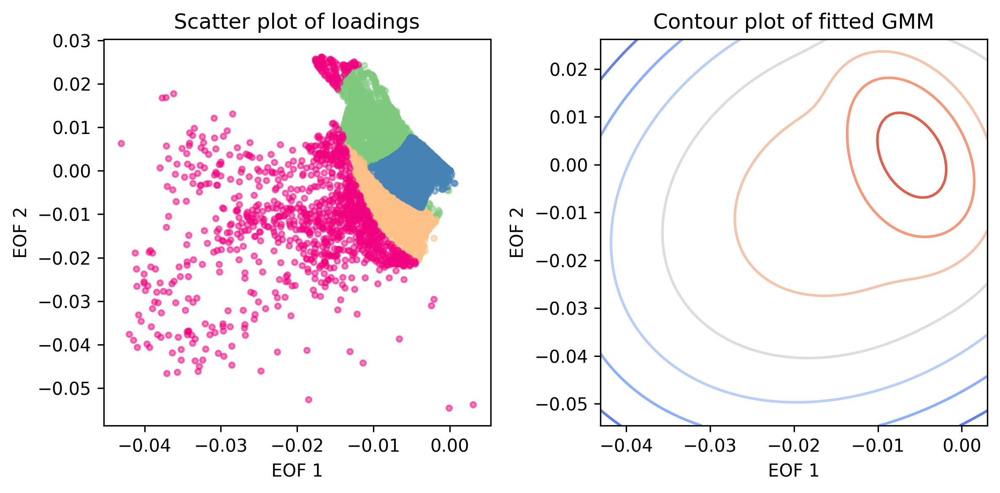

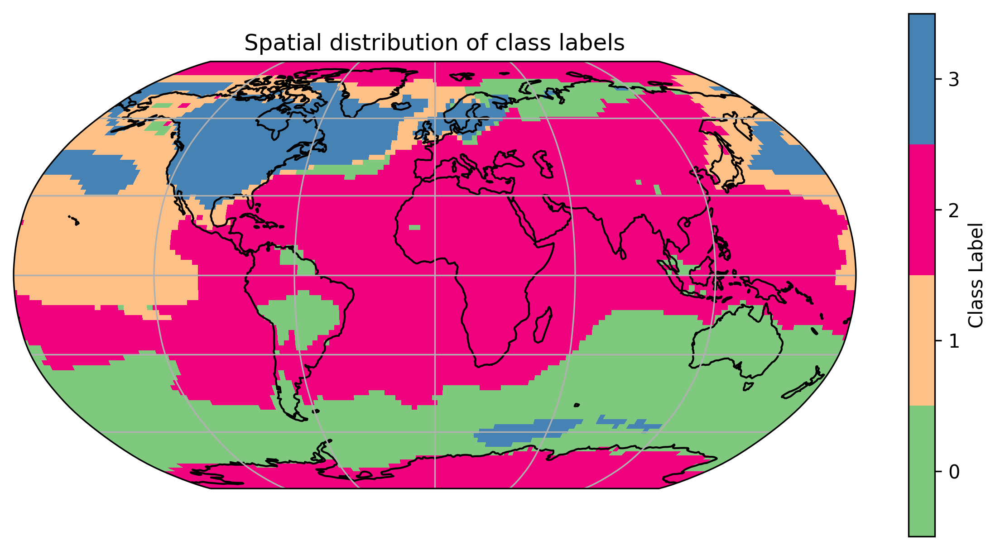

max_iter: 6


c:\Users\zps19\.conda\envs\pz-env\lib\site-packages\sklearn\mixture\_base.py:274: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


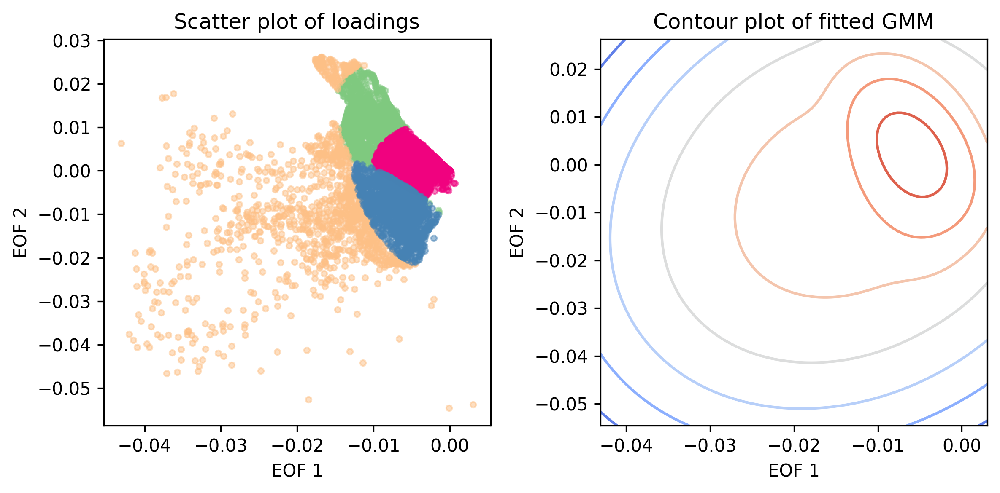

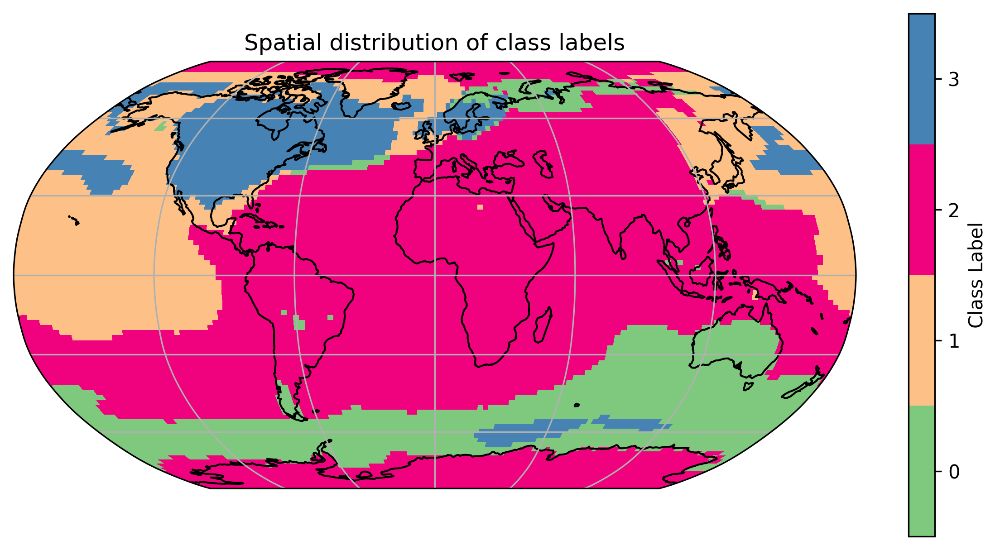

max_iter: 7


c:\Users\zps19\.conda\envs\pz-env\lib\site-packages\sklearn\mixture\_base.py:274: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


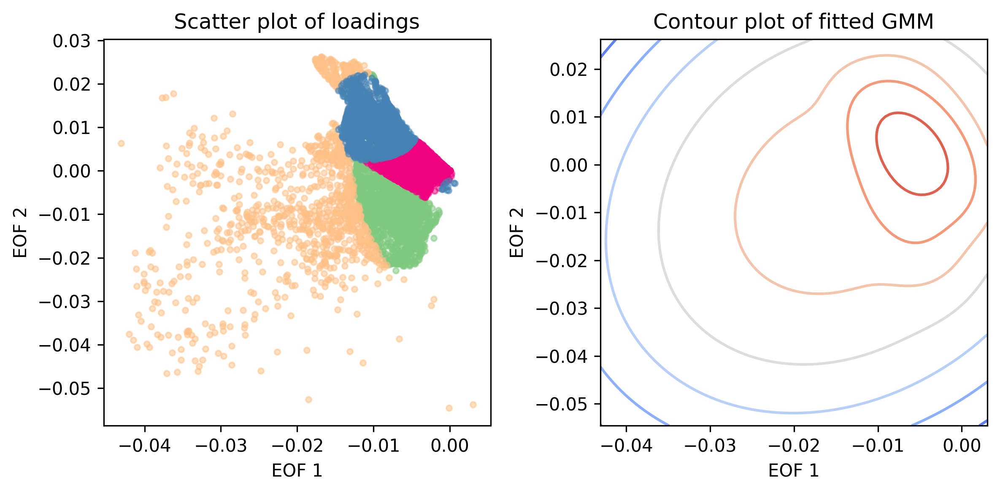

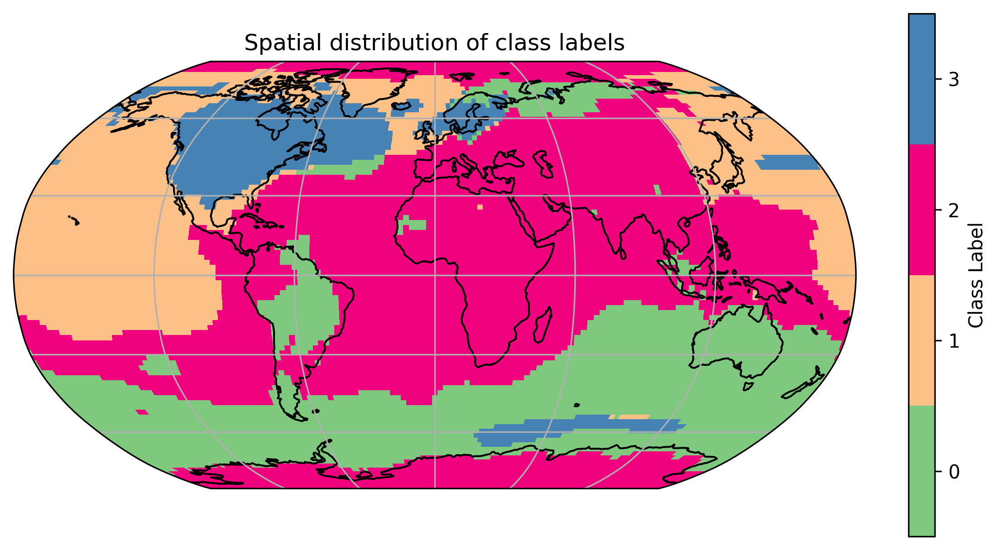

max_iter: 8


c:\Users\zps19\.conda\envs\pz-env\lib\site-packages\sklearn\mixture\_base.py:274: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


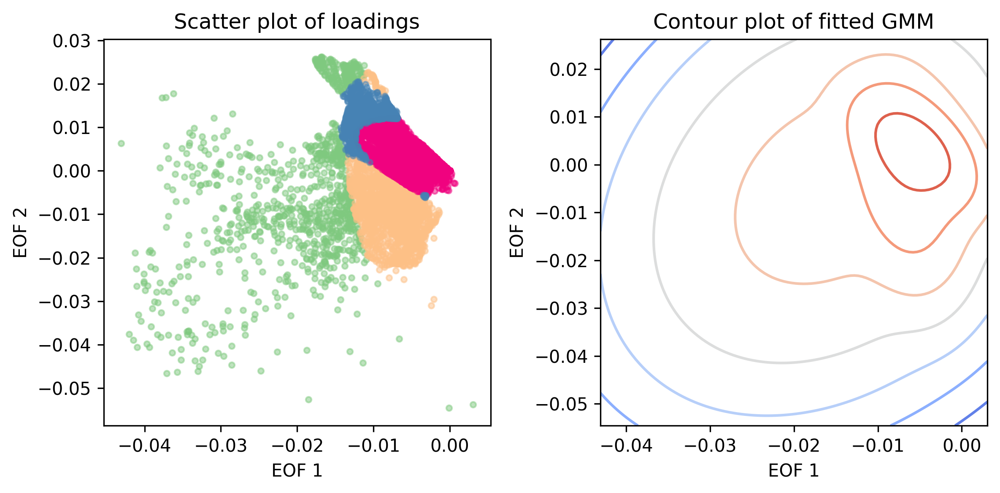

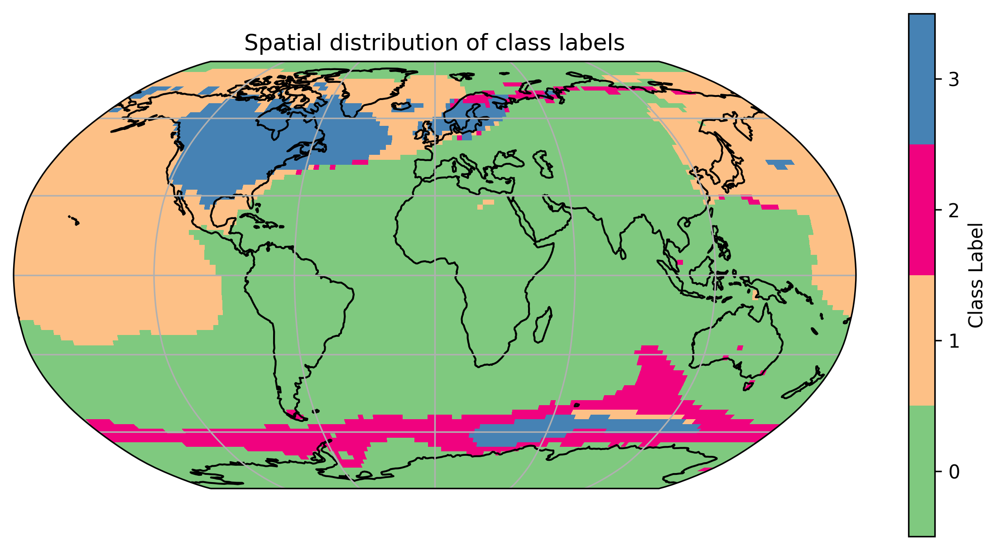

max_iter: 9


c:\Users\zps19\.conda\envs\pz-env\lib\site-packages\sklearn\mixture\_base.py:274: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


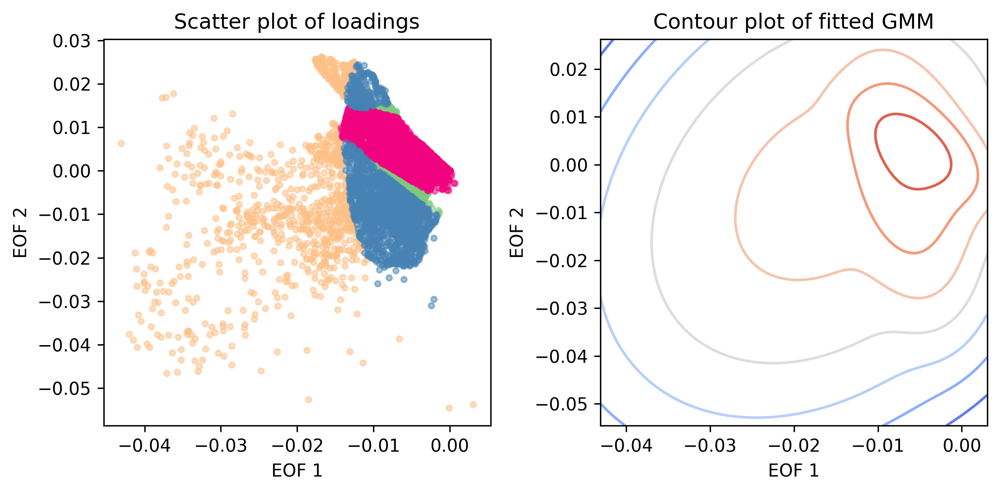

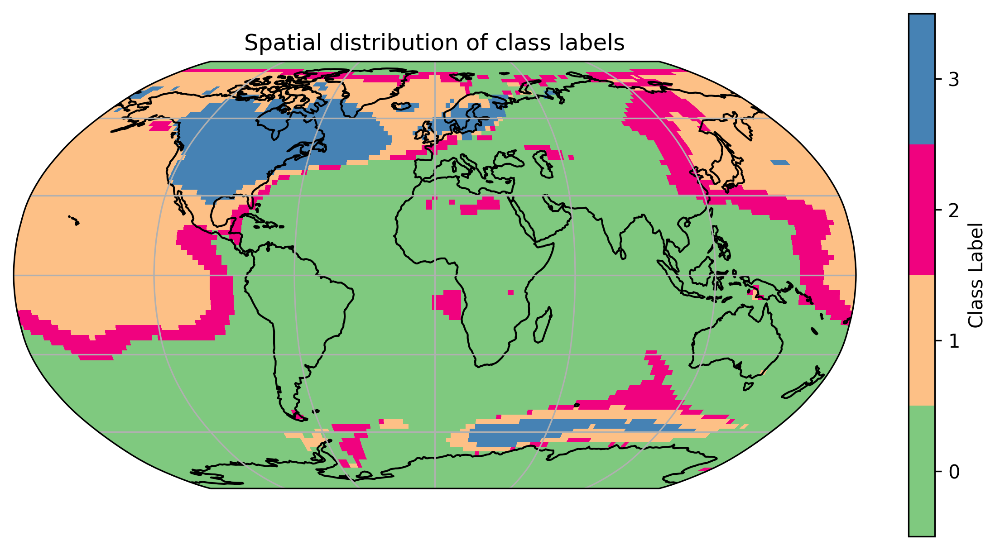

max_iter: 10


c:\Users\zps19\.conda\envs\pz-env\lib\site-packages\sklearn\mixture\_base.py:274: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


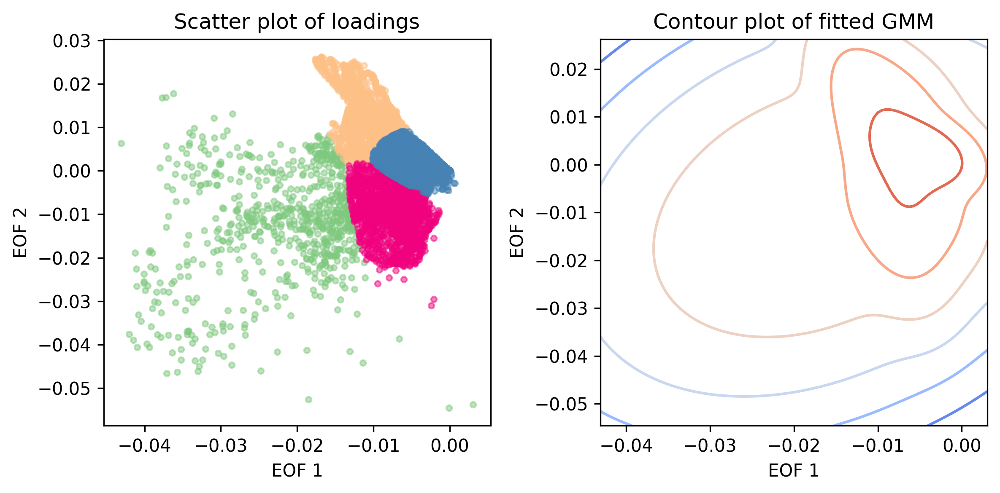

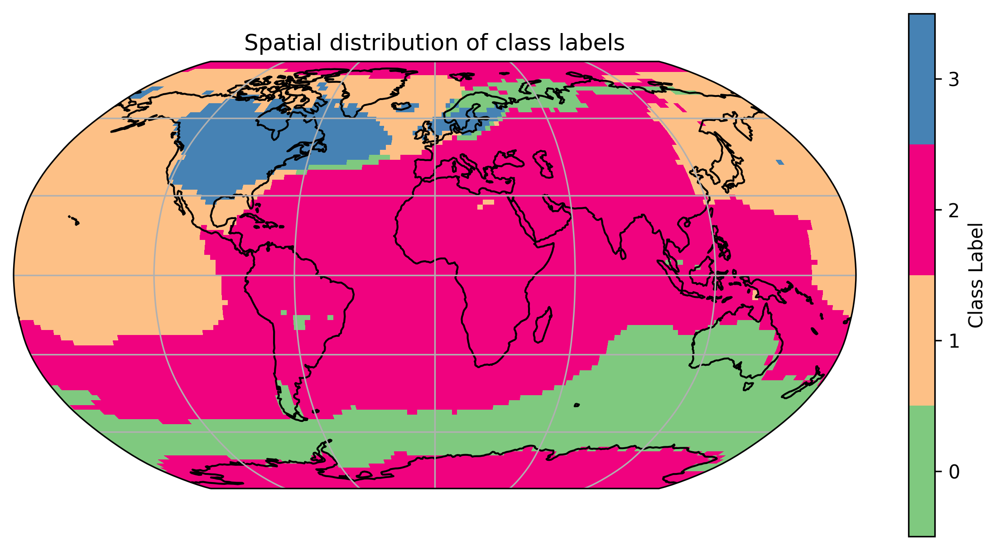

In [20]:
# loop through i in 1 to 10 to try different max_iter values
from toolbox import Ens_ana_functions as eaf


for i in range(1,11):
    print('max_iter:',i)
    ds,reshaped_probs = GMM4EOFS4gif(eofs_climo, ds_sat,n_components=4, max_iter=i)
    labels_aligned=eaf.align_labels4two_iters(reference_labels=ref_labels,labels_to_align=ds['class_label'].values.reshape(96*144,))
    ds['class_label_aligned'] = (('lat', 'lon'), labels_aligned.reshape(96, 144))
    plot_labels(ds,label_var_name='class_label_aligned')
    

In [24]:
import imageio

# Define the directory containing the images and the output GIF path
image_dir = 'D:\\VScode\\Last_deglaciation\\figs4gif'
output_gif_path = 'D:\\VScode\\Last_deglaciation\\animation.gif'

# List of image filenames in the order they should appear in the GIF
# Assuming the images are named '1.png', '2.png', ..., '7.png'
image_filenames = [f"{i}.png" for i in range(1, 8)]

# Read images
images = []
for filename in image_filenames:
    path = f"{image_dir}\\{filename}"
    images.append(imageio.imread(path))

# Save the images as a gif with looping
imageio.mimsave(output_gif_path, images, fps=1)  # loop=0 makes the GIF loop indefinitely

print("GIF created successfully.")


C:\Users\zps19\AppData\Local\Temp\ipykernel_11012\3382618719.py:15: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(path))


GIF created successfully.


In [4]:
import imageio

# Define the directory containing the images and the output GIF path
image_dir = 'D:\\VScode\\Last_deglaciation\\figs4gif'
output_gif_path = 'D:\\VScode\\Last_deglaciation\\animation_loop.gif'

# List of image filenames in the order they should appear in the GIF
# Assuming the images are named '1.png', '2.png', ..., '7.png'
image_filenames = [f"{i}.png" for i in range(1, 8)]

# Read images
images = []
for filename in image_filenames:
    path = f"{image_dir}\\{filename}"
    images.append(imageio.imread(path))

# Save the images as a gif with looping
imageio.mimsave(output_gif_path, images, fps=1, loop=0)  # loop=0 makes the GIF loop indefinitely

print("GIF created successfully.")

C:\Users\zps19\AppData\Local\Temp\ipykernel_26692\3362802161.py:15: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(path))


GIF created successfully.
